In [22]:
# from __future__ import print_function
# import time
# import numpy as np
# import pandas as pd
# # from sklearn.datasets import fetch_mldata
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
# %matplotlib inline
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
# import seaborn as sns
# from matplotlib.colors import LogNorm
# import umap.umap_ as uma
# import math
# from collections import Counter

In [1]:
from plotting import *
from Execute116 import *

In [2]:
from sklearn.manifold import TSNE

In [3]:
sys.path.insert(0, r'C:\Users\viska\Documents\AceCan')
os.chdir(r"C:\Users\viska\Documents\AceCan")
Output_path = r"C:\Users\viska\Documents\AceCan\Prepros"
# os.mkdir(Output_path)
load_data = 1
num = 40
base = 8
topk = 2000
col_range =  [8000]
row_range = [5]
display = 20
pca_comp = 8
d = base ** pca_comp  
data_dir = r'.\bki'    
test =1
name = os.path.join(Output_path, f'b{base}topk{topk}N{num}test{test}')
idx_plot = 3
# os.mkdir(name)
if test:
    pixel = 400*300
else:
    pixel = 1004 * 1344
# os.mkdir(name)

In [4]:
data1Ds, pc, mul_comb = process_dataset(data_dir, base, num, pca_comp, topk, test)

Processing 40 [test :1] images with original size [1004, 1344, 35] 
=============== run step PCA ===============
Explained Variance Ratio [0.759 0.133 0.065 0.025 0.01  0.003 0.002 0.001 0.001 0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   ]


## Check PC Components

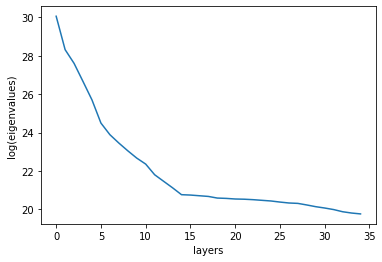

In [5]:
test_mul_comb(mul_comb,pc, pca_comp)

We see around 5-10 pc components.

In [6]:
# pt = Plotting(ver = 1004, hor = 1344)
pt = Plotting()

## Processing PCA

In [7]:
intensity, pca_results = process_pca(data1Ds, pc, num, pca_comp)

========= Intensity ==============


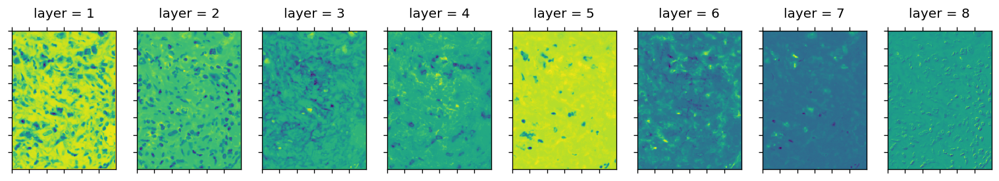

In [15]:
idx = 0
pt.plot_pca_data(pca_results[pixel*idx:pixel*(idx+1), :].T)

## Process Intensity

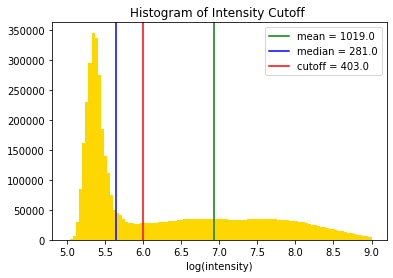

In [9]:
_, cutoffH,_ = get_intensity_hist(intensity, cutoff_log = 6, range = (5,9))

In [10]:
cutoffH

1019.0

In [11]:
stream_1D, norm_data, mask = process_intensity(pca_results, intensity, cutoffH, base, pca_comp)

norm length 1365654
norm_data -0.9995148497417065 0.5559351436146849
rebin, min/mac 0.0 6.0


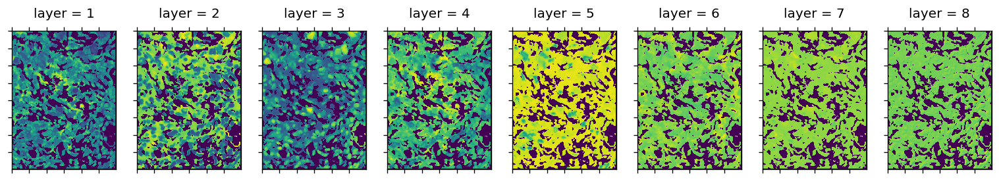

In [17]:
_ = pt.test_norm(norm_data,mask, idx = 0, bg = -1.1 )

rebin, min/mac 0.0 6.0


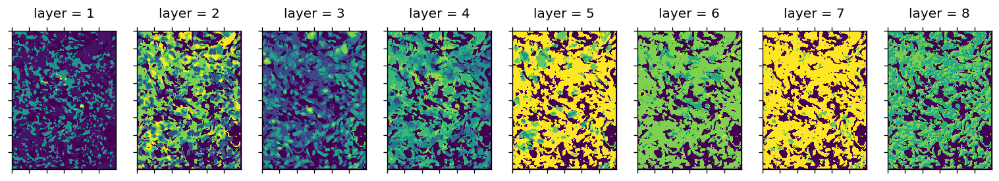

In [16]:
_ = pt.test_rebin(norm_data,mask, idx =0  )

## Counting Heavy Hitters Traditionally

In [18]:
exact_pdh, exact_pd = process_stream_1D(stream_1D, base, pca_comp, topk = 10000, percentage = 0.01)

389.87
#exact_pdh 622 389.87
        0    1    2    3    4    5    6    7   freq       val
0     0.0  5.0  4.0  4.0  4.0  3.0  3.0  4.0  38987   9292072
1     0.0  5.0  3.0  3.0  4.0  4.0  3.0  4.0  28996   9324264
2     0.0  5.0  4.0  3.0  4.0  4.0  3.0  4.0  26291   9324328
3     0.0  5.0  3.0  4.0  4.0  3.0  3.0  4.0  18981   9292008
4     0.0  5.0  4.0  4.0  4.0  4.0  3.0  4.0  17024   9324840
...   ...  ...  ...  ...  ...  ...  ...  ...    ...       ...
2134  0.0  1.0  3.0  5.0  4.0  3.0  4.0  3.0      1   7457480
2135  1.0  5.0  3.0  5.0  2.0  4.0  3.0  4.0      1   9317097
2136  1.0  4.0  2.0  5.0  3.0  4.0  3.0  4.0      1   9321121
2137  1.0  3.0  2.0  5.0  4.0  3.0  3.0  3.0      1   7195289
2138  0.0  1.0  3.0  4.0  4.0  3.0  3.0  5.0      1  11389128

[2139 rows x 10 columns]


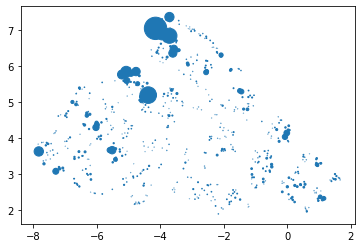

In [19]:
umap_result = process_umap(exact_pdh, pca_comp)


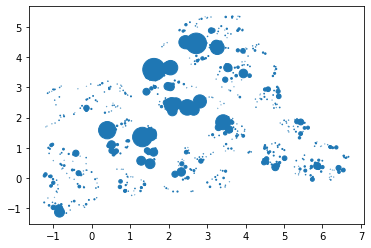

In [15]:
# umap_result = process_umap(exact_pdh, pca_comp)

In [20]:
exact_pdh['u1'] = umap_result[:,0] 
exact_pdh['u2'] = umap_result[:,1]
# np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)


C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 604 samples in 0.001s...
[t-SNE] Computed neighbors for 604 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 604 / 604
[t-SNE] Mean sigma: 0.807292
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.914299
[t-SNE] KL divergence after 300 iterations: 1.166664


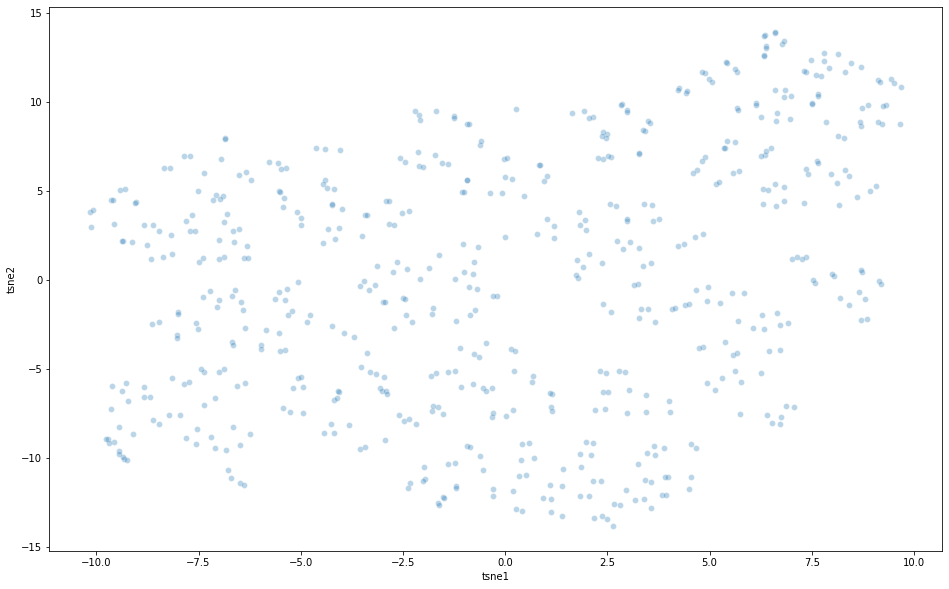

In [66]:
# tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300) 
# tsne_results = tsne.fit_transform(exact_pdh[range(8)])
# exact_pdh['tsne1'] = tsne_results[:,0]
# exact_pdh['tsne2'] = tsne_results[:,1]
# plt.figure(figsize=(16,10))
# sns.scatterplot(
#     x="tsne1", y="tsne2",
# #     hue="y",
#     palette=sns.color_palette("hls", 10),
#     data=exact_pdh,
#     legend="full",
#     alpha=0.3
# )
# # np.savetxt(f'{name}/exact_pdh', exact_pdh)

In [21]:
exact_pdh['idx'] = np.arange(len(exact_pdh))
np.savetxt(f'{name}/exact_pdh_high.cvs', exact_pdh)

C:\Users\viska\.conda\envs\streaming\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
np.savetxt(f'{name}/exact_pdh.cvs', exact_pdh)

In [22]:
exact_pdh

,0,1,2,3,4,5,6,7,freq,val,u1,u2,idx
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,38987,9292072,-4.151935,7.049330,0
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,28996,9324264,-4.383007,5.190439,1
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,26291,9324328,-3.714502,6.843219,2
3,0.0,5.0,3.0,4.0,4.0,3.0,3.0,4.0,18981,9292008,-5.077302,5.840564,3
4,0.0,5.0,4.0,4.0,4.0,4.0,3.0,4.0,17024,9324840,-3.950031,6.862466,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
617,0.0,5.0,4.0,3.0,3.0,3.0,3.0,3.0,392,7190312,-4.011430,6.126174,617
618,0.0,4.0,5.0,4.0,4.0,4.0,3.0,3.0,392,7227744,-2.199875,6.490904,618
619,0.0,1.0,4.0,3.0,4.0,3.0,3.0,4.0,392,9291528,0.552869,3.338461,619
620,1.0,5.0,3.0,1.0,4.0,3.0,3.0,3.0,392,7193321,-4.684392,2.215708,620


In [23]:
exact_pdh1 = exact_pdh

In [140]:
def get_merged_HHs(vals, base, limit):
    merge_idx_dict = {}
    val_l = len(vals)
    clusters = np.zeros(val_l)
    processed = [False] * val_l
    cluster_dict= {}
    color_idx = int(1 )
    merged = False
    for idx_1 in range(val_l):
        if not processed[idx_1]:
            val = vals[idx_1]
            cluster_dict[f'{color_idx}'] = [val]
            clusters[idx_1] = color_idx
            for idx_2 in range(idx_1+1, val_l): 
                val_2 = vals[idx_2]
                diff = abs(val - val_2)
                if check_cluster(diff, base):                   
                    if not processed[idx_2]:
                        processed[idx_2] = True
                    else:
                        color_idx2 = int(clusters[idx_2])
                        if not merged:                      
                            if color_idx2 < color_idx:
                                # print(color_idx,color_idx2,val, val_2)
                                cluster_dict[f'{color_idx2}'] += cluster_dict[f'{color_idx}'] 
                                cluster_dict[f'{color_idx}']  = []
                                clusters[clusters == color_idx] = color_idx2
                                color_idx0 = color_idx
                                color_idx = color_idx2
                                merged = True
                            else:
                                print('error')
                        else:
                            if color_idx2 != color_idx:
                                min_idx, max_idx = min( color_idx2, color_idx), max( color_idx2, color_idx)
                                if min_idx not in merge_idx_dict:
                                    merge_idx_dict[min_idx] = set() 
                                merge_idx_dict[min_idx].add(max_idx)    
                                # color_idx, color_idx0 = min(color_idx2, color_idx), max(color_idx2, color_idx)
                                # # print(color_idx2, color_idx, color_idx0 )
                                # cluster_dict[f'{color_idx}'] += cluster_dict[f'{color_idx0}'] 
                                # cluster_dict[f'{color_idx0}']  = []  
                                # clusters[clusters == color_idx0] = color_idx                    

                ####################### assign values
                    cluster_dict[f'{color_idx}'] += [val_2] 
                    clusters[idx_2] = color_idx
            ############################## End idx_2 for loop ##############################
            if merged:
                color_idx = color_idx0
                merged = False
            else:
                color_idx += 1  
            # color_idx += 1
            # print('color_idx',color_idx)
            processed[idx_1]  = True
        if color_idx > limit:
            print(f'Top {limit} color clusters found at {idx_1}, to continue increase limit' )
            break
    print(merge_idx_dict)
    return clusters, cluster_dict, merge_idx_dict

In [141]:
limit = 100
clusters, cluster_dict, merge_idx_dict = get_merged_HHs(exact_pdh['val'], base, limit)
clusters

{4: {5, 13, 15, 18, 19}, 3: {4}, 2: {6, 8, 10, 43, 17, 23, 27}, 11: {16}, 7: {13}, 5: {13, 15}, 13: {18, 20}, 8: {17, 22, 23}, 12: {21}, 1: {9}}


array([ 1.,  2.,  2.,  1.,  1.,  3.,  1.,  4.,  2.,  5.,  2.,  6.,  4.,
        4.,  4.,  5.,  3.,  7.,  1.,  8.,  4.,  4.,  4.,  1.,  8.,  7.,
        9.,  6.,  4.,  2., 10.,  2., 11., 11.,  4.,  4.,  4.,  7.,  2.,
        4.,  4.,  6.,  4., 12.,  5.,  6.,  4.,  4.,  5., 13.,  8., 10.,
        7., 12., 14., 11.,  3.,  3., 15., 13.,  8.,  5., 16.,  2., 17.,
       13., 16.,  5.,  4., 17.,  9.,  6.,  1., 10.,  4.,  4.,  4.,  3.,
        2., 18.,  2.,  2., 17., 13., 11.,  2., 11.,  2., 13.,  9., 12.,
       13., 13., 13., 13., 13., 17.,  4.,  2., 11., 13.,  3.,  4.,  2.,
        4.,  5.,  2.,  4.,  2., 13.,  2., 19.,  8., 13.,  4., 11.,  4.,
       13., 13.,  2.,  8.,  4.,  2., 16.,  5.,  3.,  2., 17.,  4.,  4.,
        2.,  2.,  4., 10., 11.,  8.,  2.,  2., 11.,  4., 13., 17., 13.,
       13.,  8., 11.,  8., 11., 11., 20.,  2.,  4.,  2., 13., 11.,  5.,
        2.,  8.,  4., 10., 13.,  4., 21.,  3., 16.,  1.,  2., 10.,  8.,
        4.,  2., 21.,  5., 13.,  4.,  4.,  4.,  4.,  2., 12.,  5

In [160]:
a = sorted(list(merge_idx_dict.keys()), reverse = True)

In [161]:
a

[13, 12, 11, 8, 7, 5, 4, 3, 2, 1]

In [169]:
merge_idx_dict

{4: {5, 13, 15, 18, 19},
 3: {4},
 2: {6, 8, 10, 17, 23, 27, 43},
 11: {16},
 7: {13},
 5: {13, 15},
 13: {18, 20},
 8: {17, 22, 23},
 12: {21},
 1: {9}}

In [181]:
merged_dict = {}
keys = sorted(list(merge_idx_dict.keys()), reverse = True)
for key in keys:
    # print(key)
    vals = merge_idx_dict[key]
    # print(vals)
    merged_dict[key] = []
    merged_dict[key] += cluster_dict[str(key)]
    for val in vals:
        # print(key, val)
        merged_dict[key] += cluster_dict[str(val)]
        if val in merged_dict.keys():
            del merged_dict[val]
        
# merged_dict

In [175]:
keys

[13, 12, 11, 8, 7, 5, 4, 3, 2, 1]

In [184]:
merge_idx_dict

{4: {5, 13, 15, 18, 19},
 3: {4},
 2: {6, 8, 10, 17, 23, 27, 43},
 11: {16},
 7: {13},
 5: {13, 15},
 13: {18, 20},
 8: {17, 22, 23},
 12: {21},
 1: {9}}

In [ ]:
for idx in range(14,)

In [188]:
merged_dict[14] = cluster_dict['14']

In [189]:
merged_dict.keys()

dict_keys([12, 11, 3, 2, 1, 14])

In [193]:
sorted(list(merged_dict.keys()))

[1, 2, 3, 11, 12, 14]

In [194]:
cluster_dict1 = {}
keys1 = sorted(list(merged_dict.keys()))
for i in range(len(keys1)):
    cluster_dict1[f'{i+1}'] = merged_dict[keys1[i]]

In [196]:
cluster_dict1.keys()

dict_keys(['1', '2', '3', '4', '5', '6'])

In [210]:
final_results, binary_results = plot_HH_masked(stream_1D, mask, cluster_dict1, bg = -1, c_ini = 2, c_fin=3)

ini,fin 2 3
0.0 1.0
1


In [27]:
pt.n_ver = 4
pt.n_hor = 10

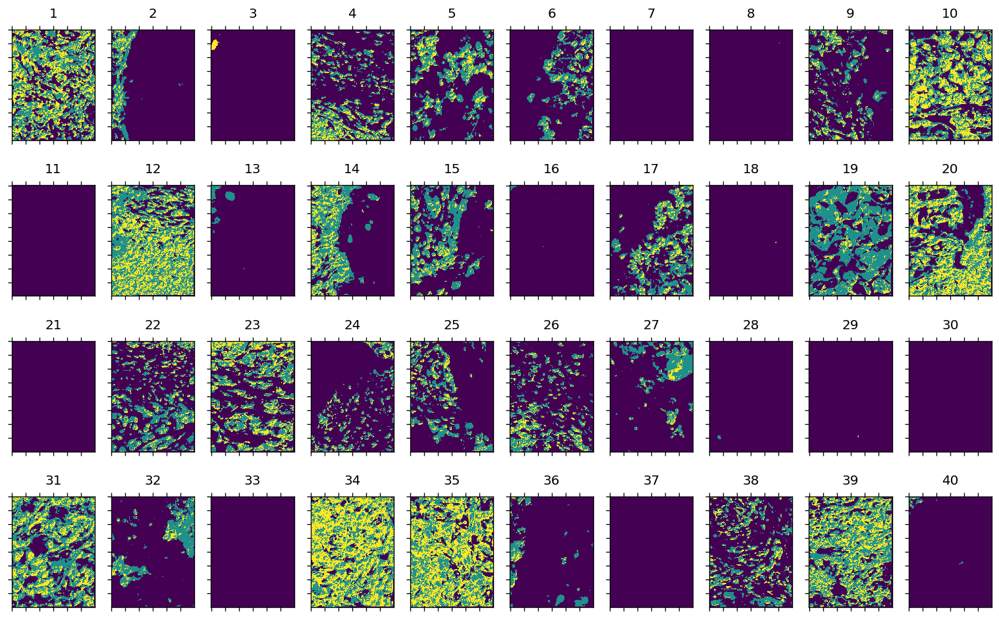

In [211]:
pt.plot_masked(binary_results)


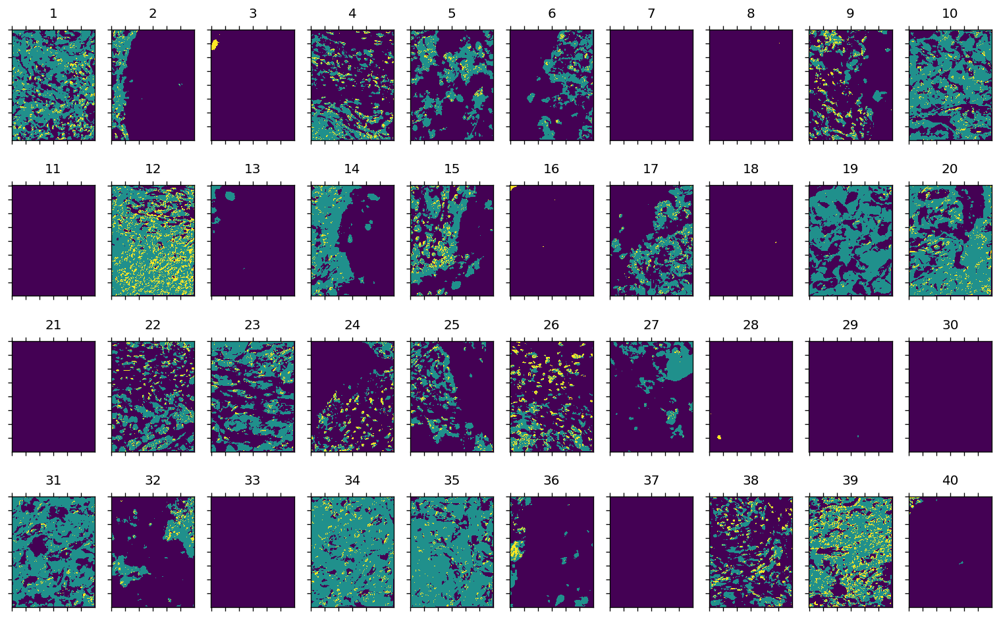

In [209]:
pt.plot_masked(binary_results)

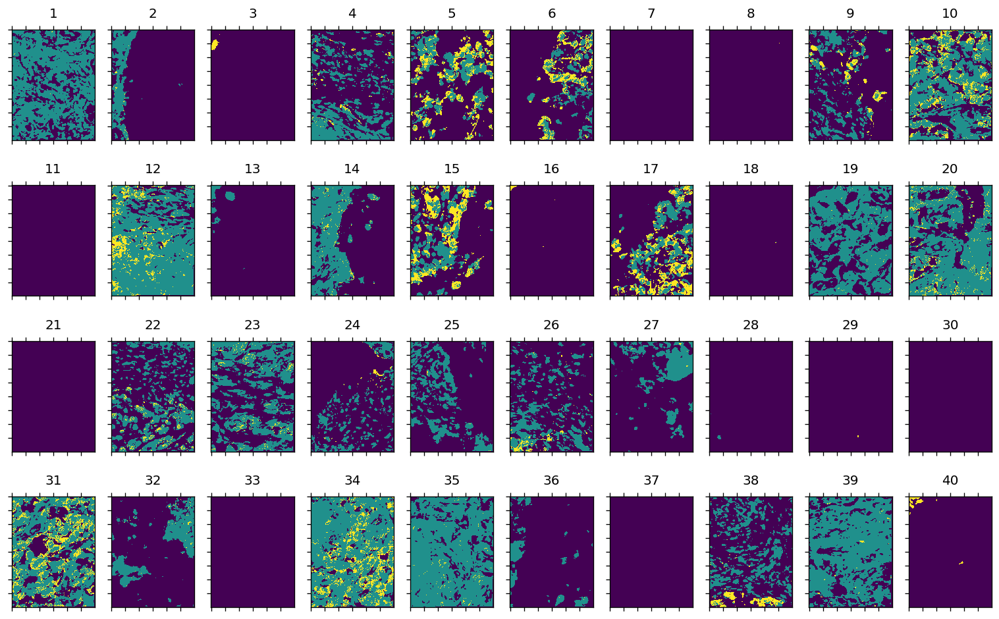

In [205]:
pt.plot_masked(binary_results)
# cluster 1

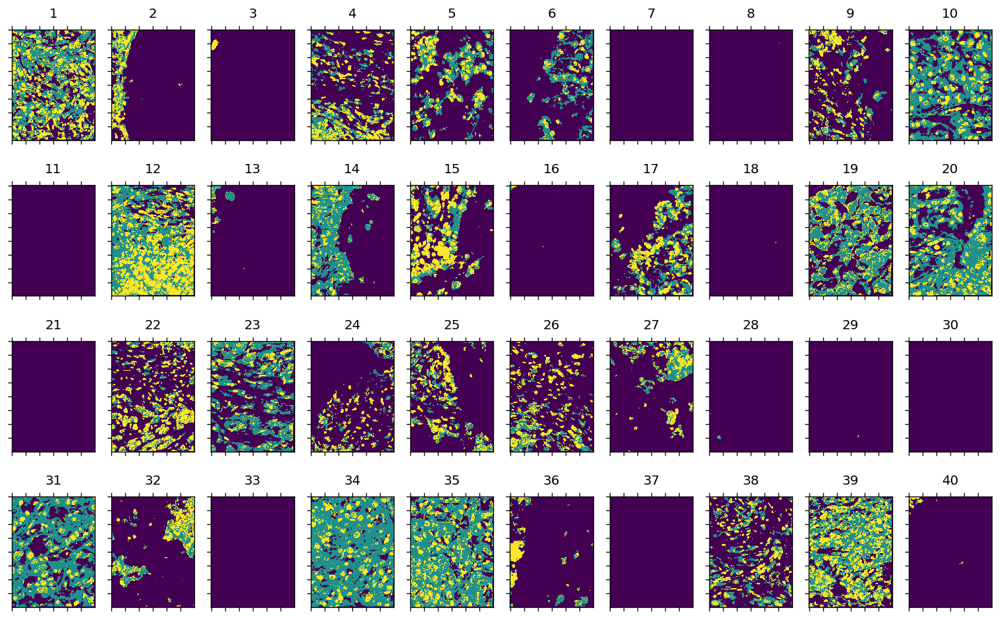

In [53]:
pt.plot_masked(binary_results)

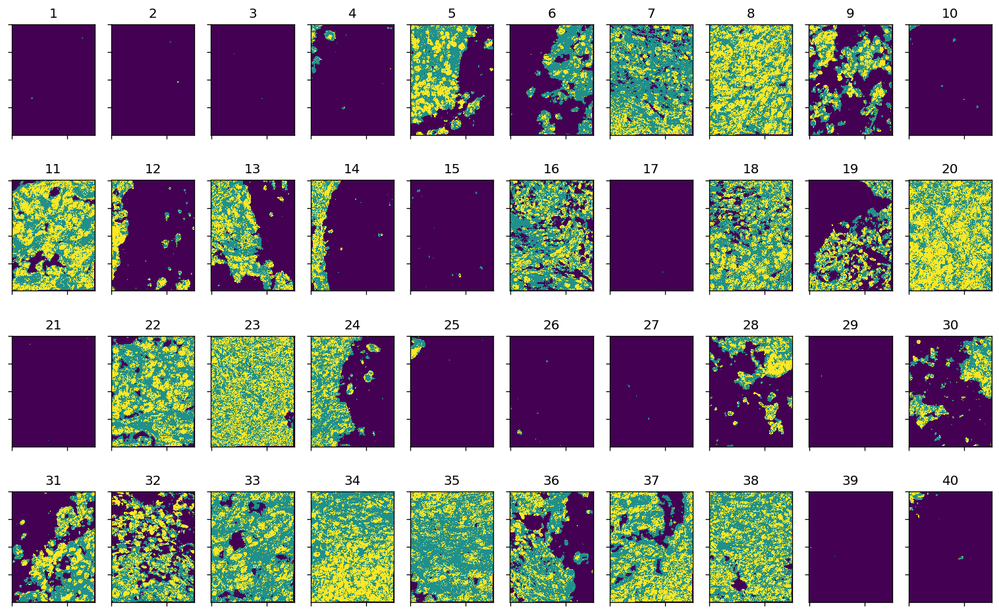

In [660]:
pt.plot_masked(final_results)

## Gluviz Clustering

In [31]:
from glue.core.state import load

In [40]:
data_collection = load(f'{name}\\make_plot.py.data')
# fig = plt.figure(figsize=(16,10))
# ax = fig.add_subplot(1, 1, 1, aspect='auto')
data0 = data_collection[0]

In [39]:
layer_data.subsets[0]

Subset: Subset 1 (data: exact_pdh)

In [47]:
# FIND ORDER
sub_range = [0,1,2,3,4,7,6,5]
for subset in sub_range:
    layer_data = data0.subsets[subset]
    print(subset,layer_data['col13'][:10])

0 [ 0.  2. 10. 13. 18. 24. 25. 28. 51. 62.]
1 [ 1.  8. 11. 20. 26. 34. 35. 50. 55. 77.]
2 [ 3.  4.  6.  9. 15. 17. 23. 32. 36. 40.]
3 [ 5. 12. 21. 22. 30. 33. 39. 41. 42. 47.]
4 [  7.  44.  46.  67.  70.  91. 125. 139. 141. 172.]
7 [ 16.  27.  37.  85. 109. 119. 123. 126. 145. 165.]
6 [ 14.  56.  60.  64.  86.  90.  92.  94. 137. 181.]
5 [ 19.  29.  31.  66. 100. 104. 106. 111. 114. 162.]


In [119]:
cluster = {}
i = 1
for subset in sub_range:
    layer_data = data0.subsets[subset]
    cluster[i] = layer_data['col13'].astype(int)
    i+=1
exact_pdh['cluster'] = np.zeros(len(exact_pdh)).astype(int)
for key in range(1,max(sub_range)+2):
    exact_pdh.loc[cluster[key],'cluster'] = int(key)

In [120]:
exact_pdh
# exact_pdh = exact_pdh.drop(['idx'], axis = 1)

,0,1,2,3,4,5,6,7,freq,val,u1,u2,cluster
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,49875,9292072,1.063387,5.582517,1
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,39918,9324264,-0.100575,4.324712,2
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,32220,9324328,1.158824,5.578264,1
3,0.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,28804,9324256,1.425807,3.109318,3
4,0.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,28127,9287904,1.616792,3.802155,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,0.0,5.0,2.0,2.0,3.0,3.0,3.0,4.0,519,9286824,-0.809919,3.296828,0
600,0.0,2.0,2.0,4.0,3.0,4.0,3.0,4.0,513,9320592,2.319675,1.000238,0
601,0.0,4.0,5.0,3.0,4.0,4.0,3.0,3.0,508,7227232,2.441728,5.405262,0
602,0.0,3.0,3.0,4.0,2.0,3.0,3.0,4.0,505,9283800,2.696003,3.312973,0


In [93]:
exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]

In [86]:

HHvals = np.array(exact_pdhh['val'])
HHcluster = np.array(exact_pdhh['cluster'])

In [294]:
def plot_umap_clusters(stream_1D, mask, exact_pdhh, bg = -1, color = 8 ):
    HHvals = np.array(exact_pdhh['val'])
    HHcluster = np.array(exact_pdhh['cluster'])
    masked_streams = np.zeros(np.shape(stream_1D))
    for idx, val in enumerate( HHvals): 
        label = HHcluster[idx]
        masked_streams = np.where(stream_1D != val, masked_streams, label)
    final_umap = np.ones(mask.shape) * bg
    binary_umap = np.ones(mask.shape) * bg
    masked_binary = (masked_streams > 0) * 1
    final_umap[mask] = masked_streams
    binary_umap[mask] = masked_binary
    return final_umap, binary_umap,  masked_streams 

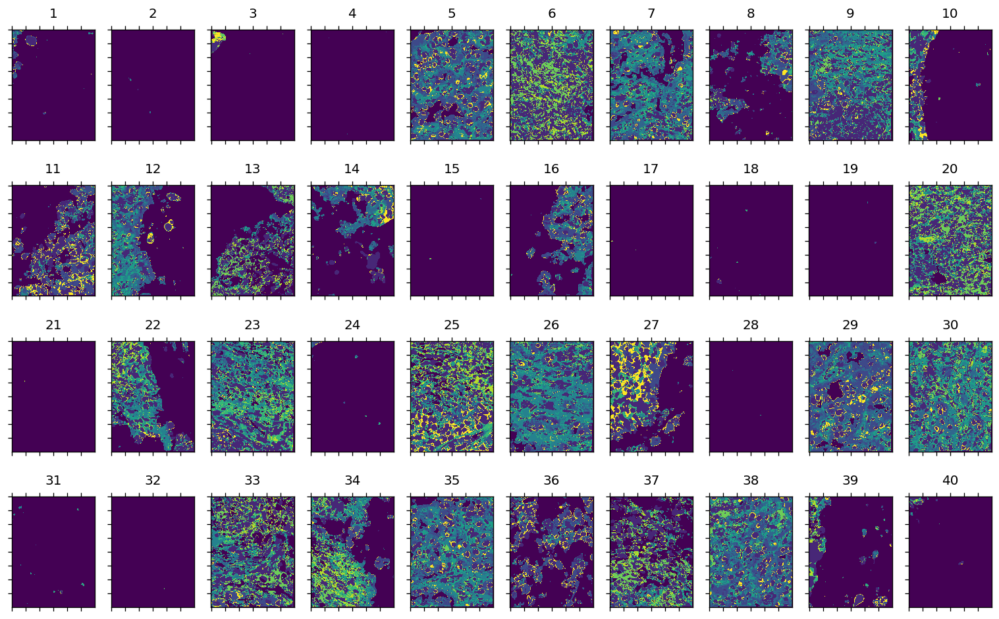

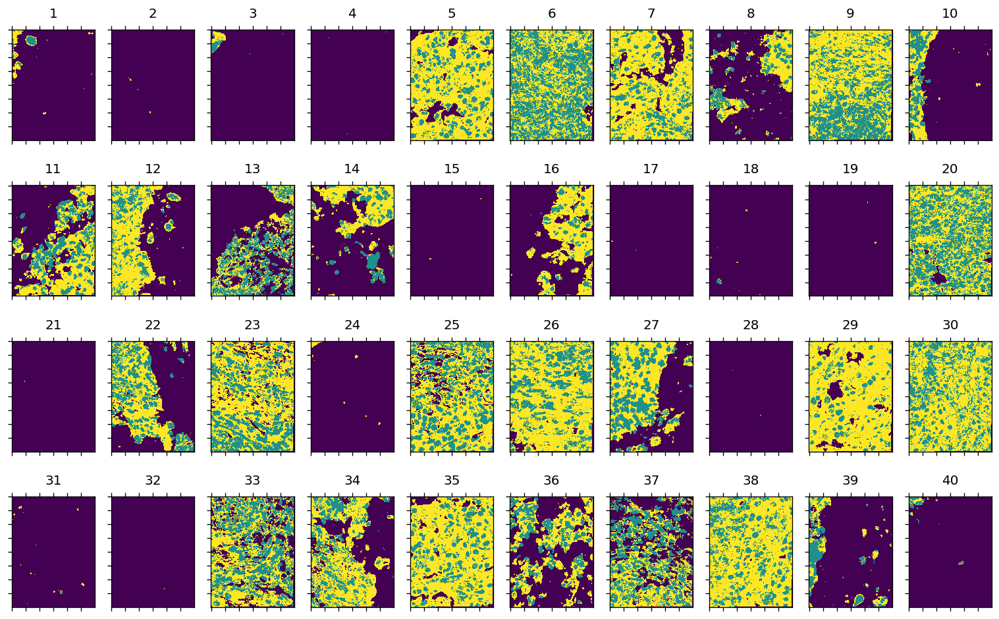

In [138]:
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
pt.plot_masked(binary_umap)

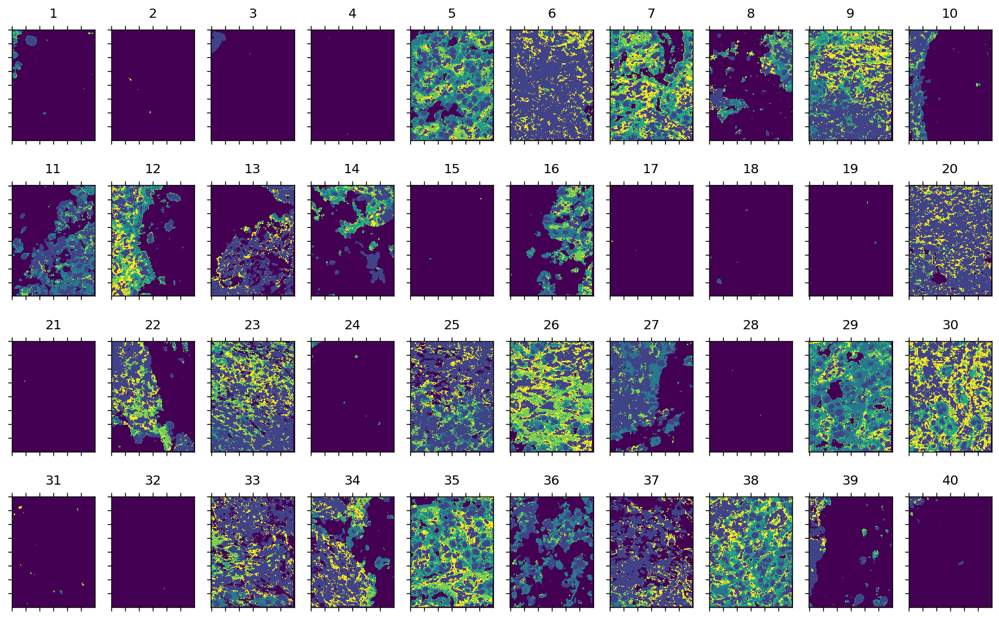

In [136]:
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

## K-means

In [212]:
from sklearn.cluster import KMeans
import seaborn as sns

In [283]:
N_cluster = 10
kmeans = KMeans(n_clusters=N_cluster)

In [284]:
kmeans.fit(umap_result, sample_weight = exact_pdh['freq'])
y_km = kmeans.predict(umap_result)

In [289]:
exact_pdh['cluster'] = y_km+1

In [290]:
exact_pdh.head()
# exact_pdh = exact_pdh.drop('y1', axis = 1)

,0,1,2,3,4,5,6,7,freq,val,u1,u2,idx,cluster
0,0.0,5.0,4.0,4.0,4.0,3.0,3.0,4.0,38987,9292072,-4.151935,7.049330,0,9
1,0.0,5.0,3.0,3.0,4.0,4.0,3.0,4.0,28996,9324264,-4.383007,5.190439,1,8
2,0.0,5.0,4.0,3.0,4.0,4.0,3.0,4.0,26291,9324328,-3.714502,6.843219,2,9
3,0.0,5.0,3.0,4.0,4.0,3.0,3.0,4.0,18981,9292008,-5.077302,5.840564,3,8
4,0.0,5.0,4.0,4.0,4.0,4.0,3.0,4.0,17024,9324840,-3.950031,6.862466,4,9


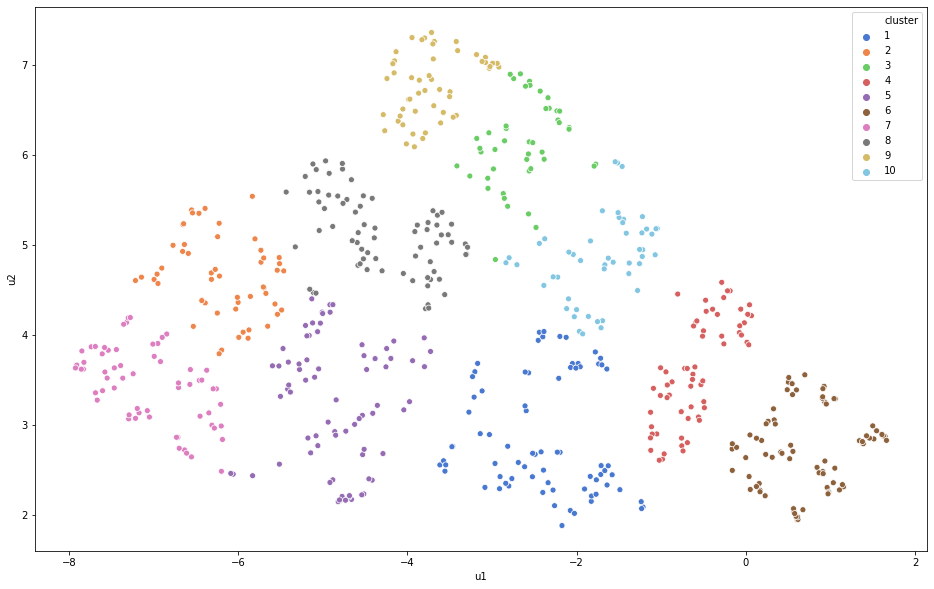

In [291]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="u1", y="u2",
    hue="cluster",
    palette=sns.color_palette("muted", N_cluster),
    data=exact_pdh,
    legend="full",
    # alpha=0.3
)
# np.savetxt(f'{name}/exact_pdh', exact_pdh)

In [282]:
masked_streams[masked_streams == 0] 
masked_streams = np.where(masked_streams != color_idx, masked_streams, color_idx)
final_umap = np.ones(mask.shape) * bg
    binary_umap = np.ones(mask.shape) * bg
    masked_binary = (masked_streams > 0) * 1
    final_umap[mask] = masked_streams
    binary_umap[mask] = masked_binary
    return final_umap, binary_umap,  masked_streams 

0.0

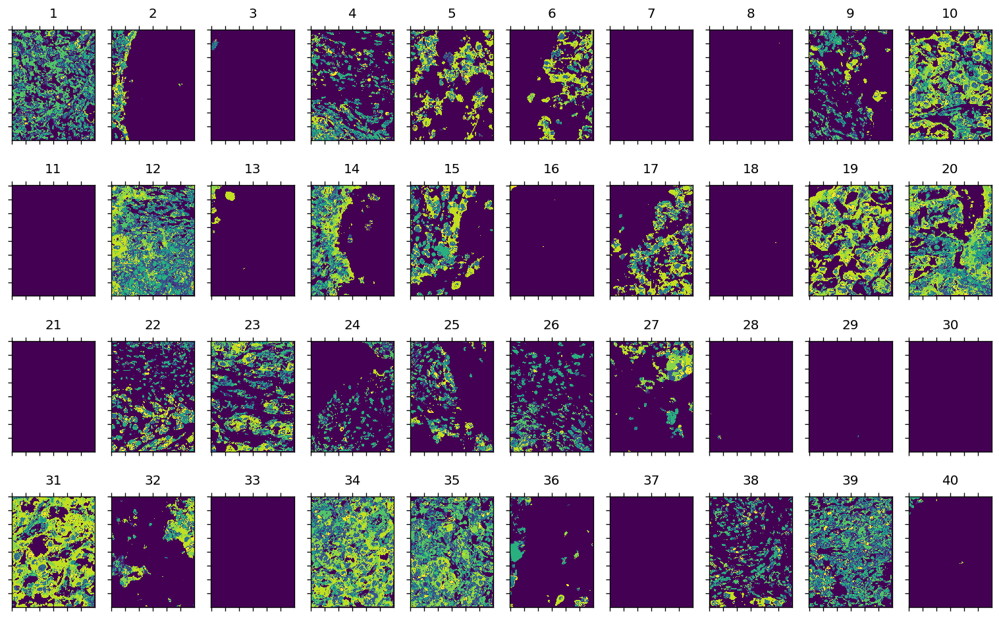

In [292]:
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] > 1]
# exact_pdhh = exact_pdh.loc[exact_pdh['cluster'] < 5]
exact_pdhh = exact_pdh
final_umap, binary_umap, masked_streams  = plot_umap_clusters(stream_1D, mask, exact_pdhh)
pt.plot_masked(final_umap)
# cluster 2 pos

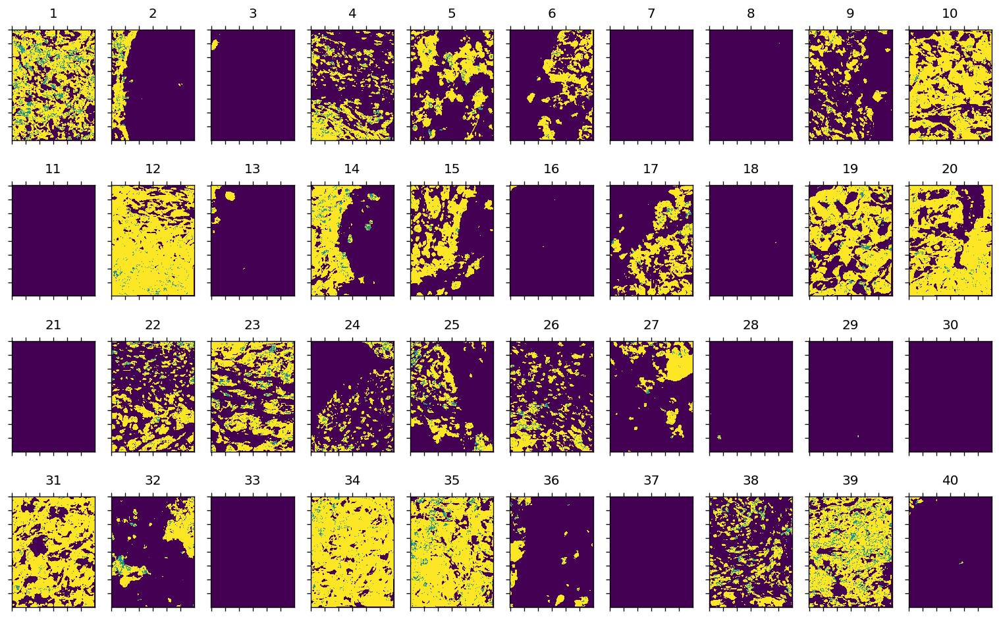

In [293]:
pt.plot_masked(binary_umap)

In [295]:
 masked_binary = (masked_streams > 0) * 1

In [297]:
masked_binary.min()

0

In [298]:
masked_streams.min()

0.0